# LOW-RANK PARAREAL NOTEBOOK

**Author:** Benjamin Carrel (University of Geneva)

This notebook aims to verify the numerical behavior of the low-rank Parareal algorithm.

## Package importations

Usual python importation of packages. Run it first.

In [1]:
## IMPORTATIONS
import numpy as np
from matplotlib import pyplot as plt, cm
from IPython.display import HTML
import os

from ivps import lyapunov
import classical_solvers
from pint import parareal


## Parameters for the experiments

In the following cell:
- Choose if you want to save the figures.
- Choose if you want to plot animations.
- Choose the method for the reference solution (optimal will automatically use the closed form formula or scipy).

The rest of the notebook can be ran without edition.


In [2]:
## Do save the figures, or do not.
do_save_figs = True # defaults to True

## Do plot the animations, or do not.
do_plot_anims = True

## Numerical method used to compute the reference solution
classic_meth = 'optimal' # defaults to 'optimal'


## Creation of the problem

Start here by defining the problem to solve.

In [3]:
# LYAPUNOV PROBLEM
PB_name = 'Lyapunov_heat'
## Problem parameters
t_span = (0.01, 2.01) # defaults to (0.01, 2.01)
size = 100 # defaults to 100
PB = lyapunov.make_heat_problem(t_span, n=size, initial_rank=21, source_rank=5, decay='exponential')
several_sizes = (50, 100, 200)
several_final_times = (1, 2, 4)
## Parareal parameters
nb_parareal_iter = 50 # defaults to 50
is_parallel = True
## Coarse solver related parameters
coarse_rank = 4
coarse_dlra_meth = 'exact_dlra_linear' # defaults to 'exact_linear_dlra', 'KSL2' can also be used with more substeps
nb_coarse_substeps = 1 # defaults to 1
several_coarse_ranks = (2, 4, 6)
## Fine solver related parameters
fine_rank = 16
fine_dlra_meth = 'exact_dlra_linear' # defaults to 'exact_linear_dlra', 'KSL2' can also be used with more substeps
nb_fine_substeps = 1 # defaults to 1
several_fine_ranks = (12, 16, 20)


In [4]:
# EXTRACT VARIABLES
iv = PB.Y0
min_shape = min(PB.Y_shape)

# PATH FOR FIGURES
current_dir = os.path.curdir
figures_dir = os.path.join(current_dir, f'figures/{PB_name}/size{min_shape}/')
if not os.path.isdir(figures_dir):
    os.makedirs(figures_dir)

## Reference solution and singular values

In this section, we compute the reference solution and check the singular values.

In [5]:
reference_solution = classical_solvers.solve(PB, t_span, iv, method=classic_meth, nb_t_steps=nb_parareal_iter, monitoring=True)
reference_solution.convert_to_dense()
print(reference_solution)

Solving with optimal: 100%|██████████| 50/50 [00:31<00:00,  1.60it/s]

Problem: Lyapunov of shape (100, 100)
Number of time steps: 51 
Stepsize: h=0.039999999999999994 
Total time of computation: 31.19 seconds


In [6]:
anim_sing_vals = reference_solution.animation_singular_values(figures_dir + f'anim_singular_values_stagnation1.gif', do_save=do_save_figs)
if do_plot_anims:
    do_anim = HTML(anim_sing_vals.to_jshtml())
else:
    do_anim = None
do_anim

MovieWriter ffmpeg unavailable; using Pillow instead.


In [8]:
# ## TIME INDEX
# time_index = nb_parareal_iter
# t = round(reference_solution.ts[time_index] - t_span[0], 2)

# ## SINGULAR VALUES PLOTS
# fig_sing_vals = reference_solution.plot_singular_values(time_index, title=f'Singular values at time t={t}', do_save=do_save_figs, filename=figures_dir + f'sing_vals_at_step_{time_index}.pdf')

# ## SOLUTION PLOT
# fig_solution = reference_solution.plot(time_index, title=f'Heat distribution at time t={t}', do_save=do_save_figs, filename=figures_dir + f'solution_at_step_{time_index}.pdf')


## LOW-RANK PARAREAL


In [9]:
### CREATE A LOW-RANK PARAREAL OBJECT
LRP = parareal.LowRankParareal(problem = PB,
                               coarse_rank=coarse_rank,
                               fine_rank=fine_rank,
                               nb_parareal_iter=nb_parareal_iter,
                               nb_coarse_substeps=nb_coarse_substeps,
                               coarse_dlra_method=coarse_dlra_meth,
                               nb_fine_substeps=nb_fine_substeps,
                               fine_dlra_method=fine_dlra_meth,
                               reference_solution=reference_solution)
LRP

Low-rank Parareal method with following properties: 
Problem: Lyapunov of shape (100, 100) 
Coarse solver: exact_dlra_linear with 1 substep(s) 
Fine solver: exact_dlra_linear with 1 substep(s) 
Number of parareal iterations: 50

### The coarse and the fine solvers

First of all, we check the error made by the coarse and fine solvers. 

The integrators must have converged to the DLRA solution for meaningful results.

DLRA (rank 16): 100%|██████████| 50/50 [00:28<00:00,  1.76it/s]


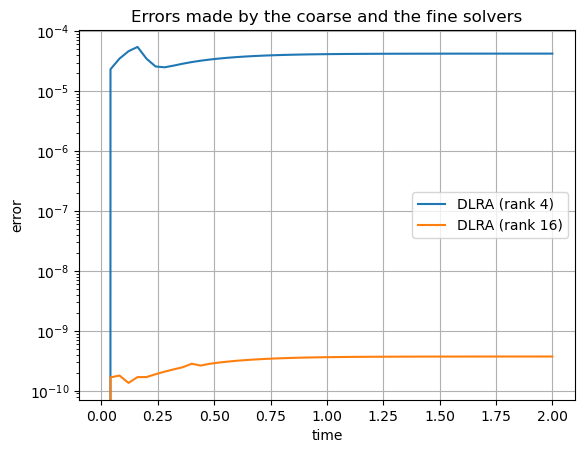

In [10]:
## COARSE SOLUTION
LRP.compute_coarse_solution()

## FINE SOLUTION
LRP.compute_fine_solution()

## PLOT THE ERRORS
fig1 = LRP.plot_coarse_and_fine_errors(title='Errors made by the coarse and the fine solvers', 
                                       do_save=do_save_figs, 
                                       filename=figures_dir + f'DLRA_errors_over_time.pdf')


### Low-rank Parareal algorithm

In this section, we inspect the behavior of the algorithm by plotting the error at each iteration.

/!\ THE COMPUTATIONS MAY TAKE A MOMENT /!\

In [11]:
## LOW-RANK PARAREAL ALGORITHM
Ynk = LRP.compute_parareal(skip_confirmation=True, do_parallel=is_parallel)

Solving with optimal: 100%|██████████| 50/50 [00:30<00:00,  1.63it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (rank 16).
The total time of computation is estimated at 1407 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [14:27<00:00, 17.35s/it]

Done. Total time of computation: 895 seconds.


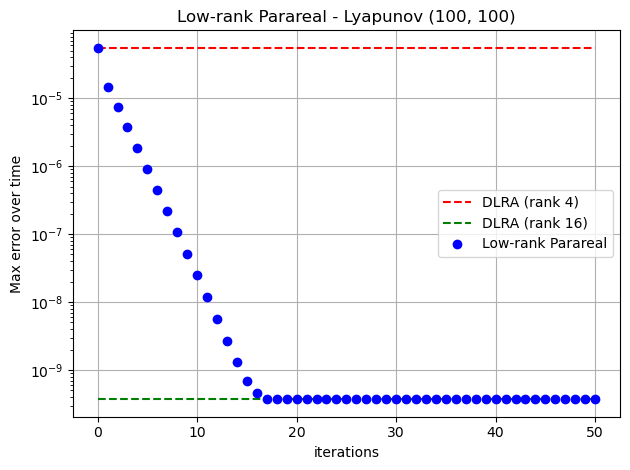

In [12]:
## LOW-RANK PARAREAL ANIMATION
LRP_animation = LRP.animation_parareal(title='Low-rank Parareal',
                                       do_save=do_save_figs,
                                       filename=figures_dir + f'anim_parareal_stagnation1_q_{coarse_rank}_r_{fine_rank}.gif')
if do_plot_anims:
    plot_anim = HTML(LRP_animation.to_jshtml())
else:
    plot_anim = None
plot_anim

### Several coarse ranks

We look at the behavior of the algorithm with several coarse ranks.

In [12]:
# SEVERAL COARSE RANKS
it = np.arange(0, nb_parareal_iter+1)
err_para_coarse_ranks = np.zeros((nb_parareal_iter+1, len(several_coarse_ranks)))

for k in range(len(several_coarse_ranks)):
    LRP.coarse_rank = several_coarse_ranks[k]
    LRP.fine_rank = fine_rank
    Ynk = LRP.compute_parareal(skip_confirmation=True, do_parallel=is_parallel)
    Enk = LRP.compute_parareal_error()
    err_para_coarse_ranks[:, k] = np.max(Enk, axis=0)

Solving with optimal: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 2).
The fine solver is DLRA (rank 16).
The total time of computation is estimated at 286 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [07:01<00:00,  8.44s/it]


Done. Total time of computation: 427 seconds.


Solving with optimal: 100%|██████████| 50/50 [00:08<00:00,  6.18it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (rank 16).
The total time of computation is estimated at 284 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [06:45<00:00,  8.11s/it]


Done. Total time of computation: 411 seconds.


Solving with optimal: 100%|██████████| 50/50 [00:08<00:00,  6.25it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 6).
The fine solver is DLRA (rank 16).
The total time of computation is estimated at 283 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [07:06<00:00,  8.54s/it]


Done. Total time of computation: 433 seconds.


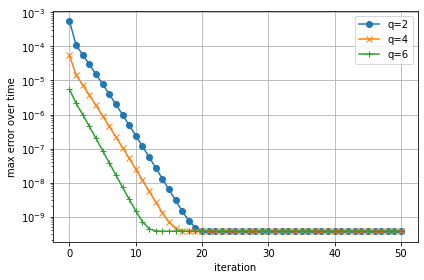

In [27]:
# PLOT SEVERAL COARSE RANKS
linestyles = ('-o', '-x', '-+')
fig = plt.figure(clear=True)
for k in range(len(several_coarse_ranks)):
    plt.semilogy(it, err_para_coarse_ranks[:, k], linestyles[k], label=f'q={several_coarse_ranks[k]}')
plt.grid()
plt.xlabel('iteration')
plt.ylabel('max error over time')
plt.tight_layout()
plt.legend()
plt.show()
if do_save_figs:
    fig.savefig(figures_dir + f'several_coarse_ranks_{several_coarse_ranks}.pdf')

### Several fine ranks

We look at the behavior of the algorithm with several fine ranks.

In [14]:
# SEVERAL FINE RANKS
it = np.arange(0, nb_parareal_iter+1)
err_para_fine_ranks = np.zeros((nb_parareal_iter+1, len(several_fine_ranks)))

for k in range(len(several_fine_ranks)):
    LRP.coarse_rank = coarse_rank
    LRP.fine_rank = several_fine_ranks[k]
    Ynk = LRP.compute_parareal(skip_confirmation=True, do_parallel=is_parallel)
    Enk = LRP.compute_parareal_error()
    err_para_fine_ranks[:, k] = np.max(Enk, axis=0)



Solving with optimal: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (rank 12).
The total time of computation is estimated at 297 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [07:12<00:00,  8.64s/it]


Done. Total time of computation: 438 seconds.


Solving with optimal: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (rank 16).
The total time of computation is estimated at 285 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [06:01<00:00,  7.23s/it]


Done. Total time of computation: 367 seconds.


Solving with optimal: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (rank 20).
The total time of computation is estimated at 285 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [07:08<00:00,  8.58s/it]


Done. Total time of computation: 435 seconds.


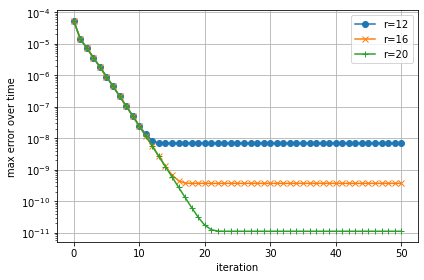

In [15]:
# PLOT SEVERAL FINE RANKS
linestyles = ('-o', '-x', '-+')
fig = plt.figure(clear=True)
for k in range(len(several_fine_ranks)):
    plt.semilogy(it, err_para_fine_ranks[:, k], linestyles[k], label=f'r={several_fine_ranks[k]}')
plt.grid()
plt.xlabel('iteration')
plt.ylabel('max error over time')
plt.tight_layout()
plt.legend()
plt.show()
if do_save_figs:
    fig.savefig(figures_dir + f'several_fine_ranks_{several_fine_ranks}.pdf')

### Several problem sizes (Lyapunov only)

In this section, we study the behavior of the algorithm with several sizes for the problem.

This cell supports only the Lyapunov heat problem.

In [16]:
# SEVERAL SIZES (ONLY LYAPUNOV)
if PB_name == 'Lyapunov_heat':
    it = np.arange(0, nb_parareal_iter+1)
    err_several_sizes = np.zeros((nb_parareal_iter+1, len(several_sizes)))

    for k in range(len(several_sizes)):
        # EDIT THE PROBLEM
        print(f'Size: {several_sizes[k]}')
        LRP.problem = lyapunov.make_heat_problem(t_span, several_sizes[k])

        # COMPUTE LOW-RANK PARAREAL
        LRP.coarse_rank = coarse_rank
        LRP.fine_rank = fine_rank
        Ynk = LRP.compute_parareal(skip_confirmation=True, do_parallel=is_parallel)
        Enk = LRP.compute_parareal_error()
        err_several_sizes[:, k] = np.max(Enk, axis=0)

else:
    print('This cell runs only for the Lyapunov problem')

Size: 50


Solving with optimal: 100%|██████████| 50/50 [00:01<00:00, 30.15it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (50, 50).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (rank 16).
The total time of computation is estimated at 83 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (50, 50): 100%|██████████| 50/50 [06:12<00:00,  7.45s/it]


Done. Total time of computation: 374 seconds.
Size: 100


Solving with optimal: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (rank 16).
The total time of computation is estimated at 281 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [05:06<00:00,  6.13s/it]


Done. Total time of computation: 312 seconds.
Size: 200


Solving with optimal: 100%|██████████| 50/50 [00:40<00:00,  1.22it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (200, 200).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (rank 16).
The total time of computation is estimated at 982 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (200, 200): 100%|██████████| 50/50 [13:20<00:00, 16.01s/it]


Done. Total time of computation: 819 seconds.


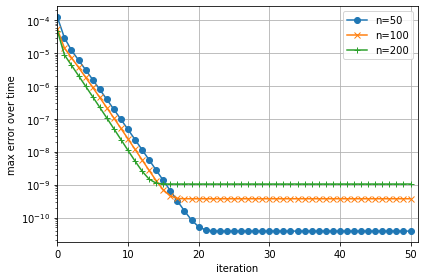

In [17]:
# PLOT ERROR SEVERAL SIZES
if PB_name == 'Lyapunov_heat':
    fig = plt.figure(clear=True)
    linestyles = ('o-','x-','+-')
    for k in range(len(several_sizes)):
        plt.semilogy(it, err_several_sizes[:, k], linestyles[k], label=f'n={several_sizes[k]}')
    plt.grid()
    plt.xlabel('iteration')
    plt.ylabel('max error over time')
    plt.tight_layout()
    plt.xlim((0,nb_parareal_iter+1))
    plt.legend()
    plt.show()
    if do_save_figs:
        fig.savefig(f'figures/{PB_name}/several_sizes_{several_sizes}.pdf')
else:
    print('This cell runs only for the Lyapunov problem')

### Several final times

In this section, we study the behavior of the algorithm with several final times of the problem.

In [18]:
# SEVERAL FINAL TIMES
if PB_name == 'Lyapunov_heat':
    ## START PLOT
    it = np.arange(0, nb_parareal_iter+1)
    err_several_final_times = np.zeros((nb_parareal_iter+1, len(several_final_times)))
    
    for k in range(len(several_final_times)):
        # EDIT THE PROBLEM
        print(f'Time interval length: {several_final_times[k]}')
        new_t_span = (t_span[0], t_span[0] + several_final_times[k])
        LRP.problem = lyapunov.make_heat_problem(new_t_span, size)

        # COMPUTE LOW-RANK PARAREAL
        LRP.coarse_rank = coarse_rank
        LRP.fine_rank = fine_rank
        Ynk = LRP.compute_parareal(skip_confirmation=True, do_parallel=is_parallel)
        Enk = LRP.compute_parareal_error()
        err_several_final_times[:, k] = np.max(Enk, axis=0)

else:
    print('This cell runs only for the Lyapunov problem')

Time interval length: 1


Solving with optimal: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (rank 16).
The total time of computation is estimated at 193 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [10:07<00:00, 12.15s/it]


Done. Total time of computation: 611 seconds.
Time interval length: 2


Solving with optimal: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (rank 16).
The total time of computation is estimated at 288 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [07:09<00:00,  8.59s/it]


Done. Total time of computation: 436 seconds.
Time interval length: 4


Solving with optimal: 100%|██████████| 50/50 [00:14<00:00,  3.57it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (rank 16).
The total time of computation is estimated at 432 seconds.
Started Parareal computations.


Low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [08:35<00:00, 10.31s/it]


Done. Total time of computation: 524 seconds.


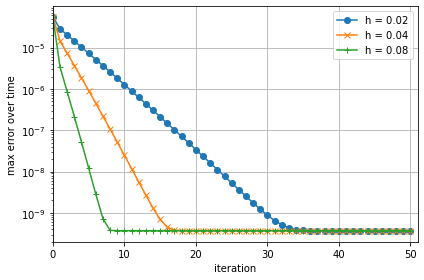

In [19]:
# PLOT SEVERAL FINAL TIMES
if PB_name == 'Lyapunov_heat':
    fig = plt.figure(clear=True)
    linestyles = ('o-','x-','+-')
    for k in range(len(several_final_times)):
        stepsize = several_final_times[k] / nb_parareal_iter
        plt.semilogy(it, err_several_final_times[:, k], linestyles[k], label=f'h = {round(stepsize, 2)}')
    plt.grid()
    plt.xlabel('iteration')
    plt.ylabel('max error over time')
    plt.tight_layout()
    plt.xlim((0,nb_parareal_iter+1))
    plt.legend()
    plt.show()
    if do_save_figs:
        fig.savefig(figures_dir + f'several_final_times_{several_final_times}.pdf')
else:
    print('This cell runs only for the Lyapunov problem')

## ADAPTIVE LOW-RANK PARAREAL

In this section, we look at different aspects of an adaptive version of the low-rank Parareal algorithm

### Fixed coarse rank, adaptive fine rank

In [20]:
## CREATE AN ADAPTIVE LOW-RANK PARAREAL OBJECT
ALRP = parareal.AdaptiveLowRankParareal(problem = PB,
                               coarse_rank=coarse_rank,
                               fine_tolerance=1e-9,
                               nb_parareal_iter=nb_parareal_iter,
                               nb_coarse_substeps=nb_coarse_substeps,
                               coarse_dlra_method=coarse_dlra_meth,
                               nb_fine_substeps=nb_fine_substeps,
                               fine_dlra_method=fine_dlra_meth,
                               reference_solution=reference_solution)

DLRA (tol 1.00e-09): 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]


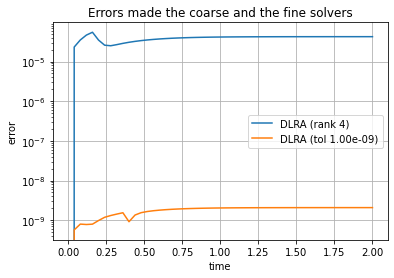

In [21]:
## PLOT COARSE AND FINE ERRORS
fig = ALRP.plot_coarse_and_fine_errors('Errors made the coarse and the fine solvers', 
                                 do_save=do_save_figs,
                                 filename=figures_dir + f'adaptive_DLRA_errors_over_time.pdf')

In [22]:
## COMPUTE ADAPTIVE LOW-RANK PARAREAL...
Ynk = ALRP.compute_parareal(skip_confirmation=True, do_parallel=is_parallel)

Solving with optimal: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (tol 1.00e-09).
The total time of computation is estimated at 283 seconds.
Started Parareal computations.


Adaptive low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [03:07<00:00,  3.75s/it]

Done. Total time of computation: 193 seconds.


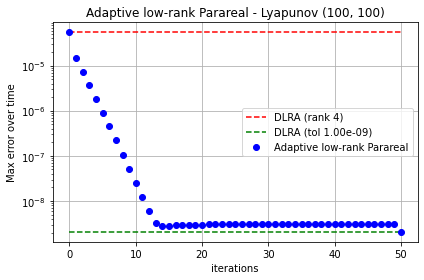

In [23]:
## ... AND ITS ANIMATION
ALRP_animation = ALRP.animation_parareal(title='Adaptive low-rank Parareal',
                                       do_save=do_save_figs,
                                       filename=figures_dir + f'anim_adaptive_parareal_q_{coarse_rank}_rtol_{ALRP.fine_tol}.gif')
if do_plot_anims:
    plot_anim = HTML(ALRP_animation.to_jshtml())
else:
    plot_anim = None
plot_anim

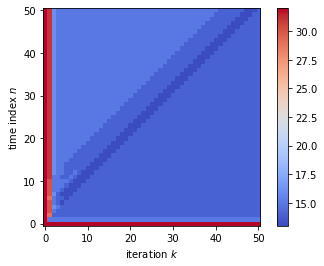

In [24]:
## HEAT MAP OF THE RANK FOR N AND K
ranks_nk = np.zeros((nb_parareal_iter+1, nb_parareal_iter+1))
for n in np.arange(nb_parareal_iter+1):
    for k in np.arange(nb_parareal_iter+1):
        ranks_nk[n, k] = ALRP.parareal_solution[n, k].rank
        
        

fig = plt.figure(clear=True)
plt.imshow(ranks_nk, cmap=cm.coolwarm, origin='lower')
plt.xlabel(r'iteration $k$')
plt.ylabel(r'time index $n$')
plt.colorbar()
plt.show()
if do_save_figs:
    fig.savefig(figures_dir + 'adaptive_parareal_ranks_map.pdf')


### Several fine tolerances

In [25]:
# SEVERAL FINE TOLERANCES (ONLY LYAPUNOV)
several_fine_tols = [1e-7, 1e-9, 1e-11]
if PB_name == 'Lyapunov_heat':
    it = np.arange(0, nb_parareal_iter+1)
    err_several_fine_tols = np.zeros((nb_parareal_iter+1, len(several_fine_tols)))

    for k in range(len(several_fine_tols)):
        # LOW-RANK PARAREAL OF MODIFIED COARSE RANK
        ALRP.coarse_rank = coarse_rank
        ALRP.fine_tol = several_fine_tols[k]
        Ynk = ALRP.compute_parareal(skip_confirmation=True, do_parallel=is_parallel)
        Enk = ALRP.compute_parareal_error()
        err_several_fine_tols[:, k] = np.max(Enk, axis=0)
else:
    print('This cell runs only for the Lyapunov problem')

Solving with optimal: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (tol 1.00e-07).
The total time of computation is estimated at 267 seconds.
Started Parareal computations.


Adaptive low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [06:49<00:00,  8.20s/it]


Done. Total time of computation: 415 seconds.


Solving with optimal: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (tol 1.00e-09).
The total time of computation is estimated at 285 seconds.
Started Parareal computations.


Adaptive low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [05:57<00:00,  7.16s/it]


Done. Total time of computation: 364 seconds.


Solving with optimal: 100%|██████████| 50/50 [00:07<00:00,  6.96it/s]


Please check the parameters:
The problem to solve is Lyapunov of shape (100, 100).
The coarse solver is DLRA (rank 4).
The fine solver is DLRA (tol 1.00e-11).
The total time of computation is estimated at 286 seconds.
Started Parareal computations.


Adaptive low-rank Parareal applied to Lyapunov (100, 100): 100%|██████████| 50/50 [07:04<00:00,  8.49s/it]


Done. Total time of computation: 430 seconds.


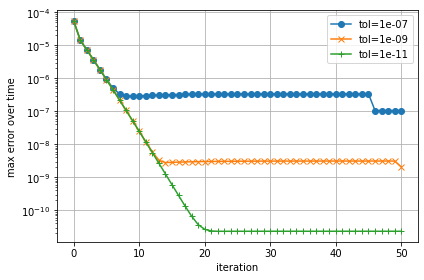

In [26]:
# PLOT SEVERAL FINE TOLERANCES
if PB_name == 'Lyapunov_heat':
    fig = plt.figure(clear=True)
    for k in range(len(several_fine_tols)):
        plt.semilogy(it, err_several_fine_tols[:, k], linestyles[k], label=f'tol={several_fine_tols[k]}')
    plt.grid()
    plt.xlabel('iteration')
    plt.ylabel('max error over time')
    plt.tight_layout()
    plt.legend()
    plt.show()
    if do_save_figs:
        fig.savefig(figures_dir + f'several_fine_tols_{several_fine_tols}.pdf')
else:
    print('This cell runs only for the Lyapunov problem')

## END OF THE NOTEBOOK